### Import statements

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import log_loss
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn import ensemble
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from xgboost import plot_tree
import xgboost as xgb
from sklearn.linear_model import LogisticRegression 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix,r2_score
import warnings
import missingno as msno
from sklearn.svm import SVC
from statsmodels.api import OLS
from xgboost import XGBRegressor  
import statsmodels.api as sm
from google.colab import files

### Reading Training and Testing data 

In [ ]:
# Reading Train and test data 
train_df = pd.read_csv("Training.csv")
test_df = pd.read_csv("Testing.csv")

### Understanding the data

In [ ]:
train_df.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis,Unnamed: 133
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN


In [ ]:
train_df.shape

(4920, 134)

In [ ]:
test_df.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Allergy
2,0,0,0,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,GERD
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Chronic cholestasis
4,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Drug Reaction


In [ ]:
test_df.shape

(42, 133)

In [ ]:
A = train_df
B = test_df

# display 30-60 indices of columns
A.columns[30:60]

Index(['indigestion', 'headache', 'yellowish_skin', 'dark_urine', 'nausea',
       'loss_of_appetite', 'pain_behind_the_eyes', 'back_pain', 'constipation',
       'abdominal_pain', 'diarrhoea', 'mild_fever', 'yellow_urine',
       'yellowing_of_eyes', 'acute_liver_failure', 'fluid_overload',
       'swelling_of_stomach', 'swelled_lymph_nodes', 'malaise',
       'blurred_and_distorted_vision', 'phlegm', 'throat_irritation',
       'redness_of_eyes', 'sinus_pressure', 'runny_nose', 'congestion',
       'chest_pain', 'weakness_in_limbs', 'fast_heart_rate',
       'pain_during_bowel_movements'],
      dtype='object')

In [ ]:
A["indigestion"]

0       0
1       0
2       0
3       0
4       0
       ..
4915    0
4916    0
4917    0
4918    0
4919    0
Name: indigestion, Length: 4920, dtype: int64

In [ ]:
A["prognosis"].unique()

array(['Fungal infection', 'Allergy', 'GERD', 'Chronic cholestasis',
       'Drug Reaction', 'Peptic ulcer diseae', 'AIDS', 'Diabetes ',
       'Gastroenteritis', 'Bronchial Asthma', 'Hypertension ', 'Migraine',
       'Cervical spondylosis', 'Paralysis (brain hemorrhage)', 'Jaundice',
       'Malaria', 'Chicken pox', 'Dengue', 'Typhoid', 'hepatitis A',
       'Hepatitis B', 'Hepatitis C', 'Hepatitis D', 'Hepatitis E',
       'Alcoholic hepatitis', 'Tuberculosis', 'Common Cold', 'Pneumonia',
       'Dimorphic hemmorhoids(piles)', 'Heart attack', 'Varicose veins',
       'Hypothyroidism', 'Hyperthyroidism', 'Hypoglycemia',
       'Osteoarthristis', 'Arthritis',
       '(vertigo) Paroymsal  Positional Vertigo', 'Acne',
       'Urinary tract infection', 'Psoriasis', 'Impetigo'], dtype=object)

### Visualizing the features

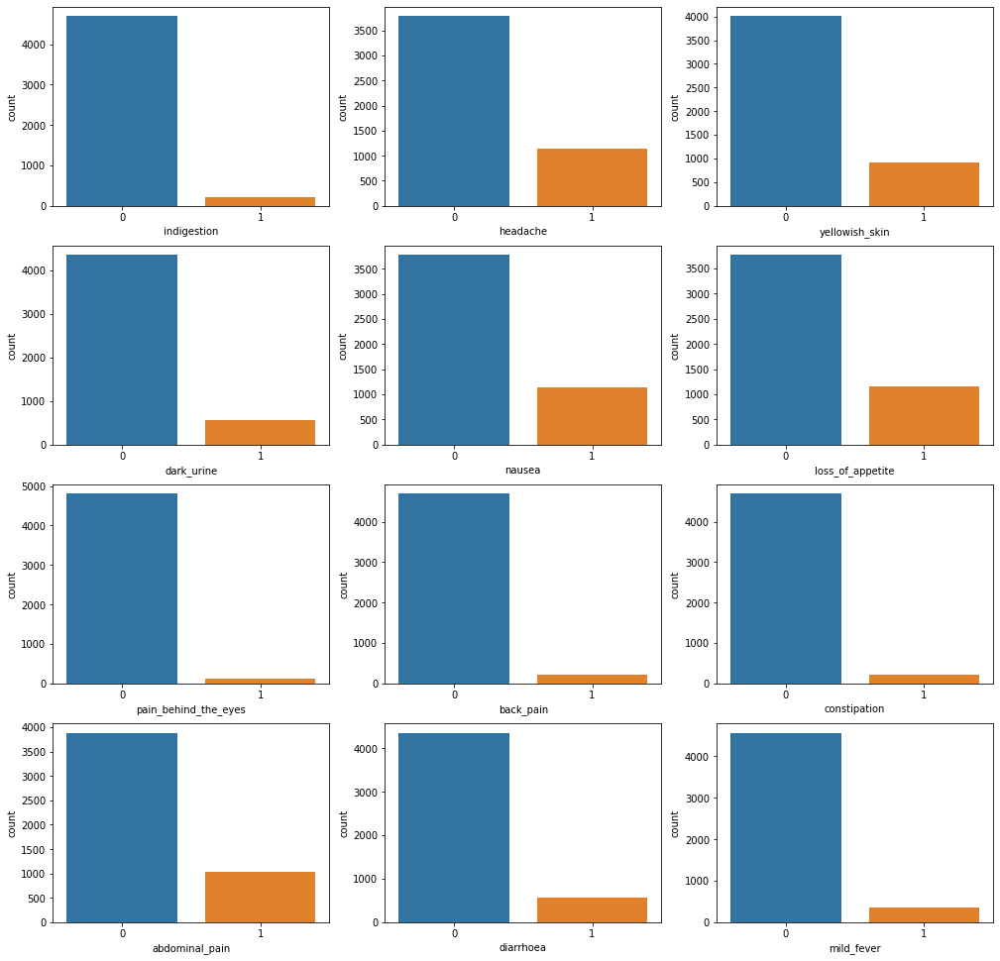

In [ ]:
features = ['indigestion', 'headache', 'yellowish_skin', 'dark_urine', 'nausea',
       'loss_of_appetite', 'pain_behind_the_eyes', 'back_pain', 'constipation',
       'abdominal_pain', 'diarrhoea', 'mild_fever']

plt.figure(figsize = (17,17))
for i, feature in enumerate(features):
    plt.subplot(4,3,i+1)
    sns.countplot(x = feature, data = A)
    plt.xlabel(feature)
plt.show()

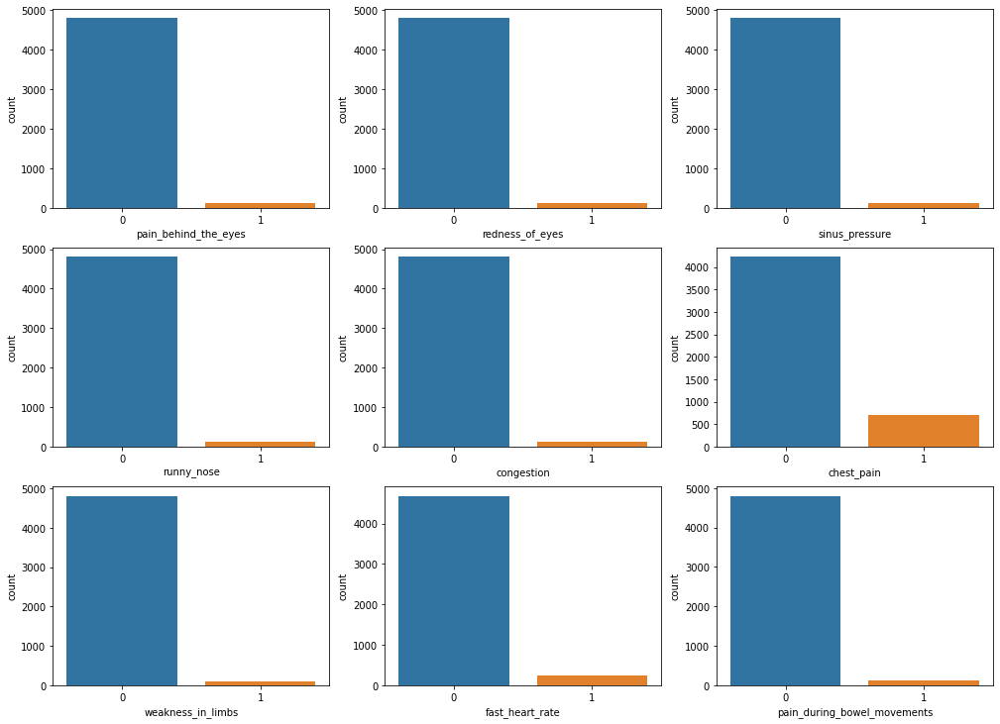

In [ ]:
features = ['pain_behind_the_eyes', 'redness_of_eyes', 'sinus_pressure', 'runny_nose', 'congestion',
       'chest_pain', 'weakness_in_limbs', 'fast_heart_rate',
       'pain_during_bowel_movements']

plt.figure(figsize = (17,17))

for i, feature in enumerate(features):
    plt.subplot(4,3,i+1)
    sns.countplot(x = feature, data = A)
    plt.xlabel(feature)
plt.show()

### Preprocessing the Data

In [ ]:
# check for null values
train_df.isnull().any()

itching                 False
skin_rash               False
nodal_skin_eruptions    False
continuous_sneezing     False
shivering               False
                        ...  
blister                 False
red_sore_around_nose    False
yellow_crust_ooze       False
prognosis               False
Unnamed: 133             True
Length: 134, dtype: bool

In [ ]:
# Removing null values
null_cols = train_df.columns[train_df.isna().any()]
train_df[null_cols].isna().sum()

Unnamed: 133    4920
dtype: int64

In [ ]:
#Removing Unnamed Column
train_df=train_df.drop(["Unnamed: 133"],axis=1)
train_df.shape

(4920, 133)

In [ ]:
train_df.prognosis.value_counts()

Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
Allergy      

Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
Allergy      

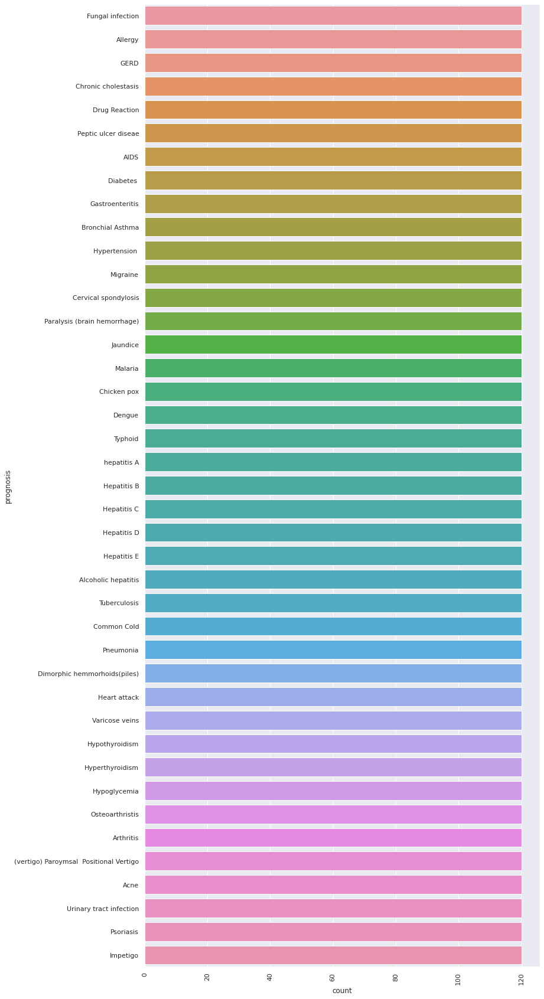

In [ ]:
import seaborn as sns

sns.set_theme(style="darkgrid")
plt.figure(figsize = (12,30))
plt.xticks(rotation = 90)
sns.countplot(y="prognosis", data=A)
print(A["prognosis"].value_counts())

### Splitting the data

In [ ]:
from sklearn.preprocessing import LabelEncoder
lbl=LabelEncoder()

X_train = train_df.iloc[:, :-1].values 
y_train = train_df.iloc[:, 132].values
y_train=lbl.fit_transform(y_train)

X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, 132].values
y_test=lbl.fit_transform(y_test)

## **Model 1 - Logistic Regression**

In [ ]:
logistic_model = LogisticRegression(random_state=0)
logistic_model.fit(X_train, y_train)
y_pred_log = logistic_model.predict(X_test)
print(classification_report(y_test, y_pred_log))
x = sm.add_constant(X_train)
lm = sm.OLS(y_train, X_train).fit()
lm.summary()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         1
          15       1.00      1.00      1.00         2
          16       1.00      1.00      1.00         1
          17       1.00    

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.990
Model:                            OLS   Adj. R-squared (uncentered):              0.990
Method:                 Least Squares   F-statistic:                              3962.
Date:                Wed, 15 Mar 2023   Prob (F-statistic):                        0.00
Time:                        21:13:06   Log-Likelihood:                         -11128.
No. Observations:                4920   AIC:                                  2.250e+04
Df Residuals:                    4800   BIC:                                  2.328e+04
Df Model:                         120                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.9436      0.255      3.704      0.000       0.444       1.443
x2             3.1411      0.277     11.341      0.000       2.598       3.684
x3             6.0189      0.520     11.583      0.000       5.000       7.038
x4             0.7726      0.493      1.568      0.117      -0.193       1.738
x5             1.0145      0.557      1.821      0.069      -0.078       2.107
x6             1.5716      0.324      4.846      0.000       0.936       2.207
x7             3.3341      0.314     10.632      0.000       2.719       3.949
x8             2.5466      0.432      5.901      0.000       1.701       3.393
x9             2.4829      0.478      5.199      0.000       1.547       3.419
x10            1.3845      0.557      2.485      0.013       0.292       2.477
x11           -0.4209      0.565     -0.744      0.457      -1.529       0.688
x12            3.1734      0.184     17.206      0.000       2.812       3.535
x13            5.6491      0.414     13.639      0.000       4.837       6.461
x14            3.0316      0.520      5.835      0.000       2.013       4.050
x15            3.0959      0.201     15.430      0.000       2.703       3.489
x16            0.5301      0.990      0.535      0.592      -1.411       2.471
x17            0.8840      0.987      0.895      0.371      -1.052       2.820
x18            0.5301      0.990      0.535      0.592      -1.411       2.471
x19            0.8877      0.700      1.268      0.205      -0.484       2.260
x20            7.4231      0.395     18.793      0.000       6.649       8.197
x21            1.1392      0.700      1.628      0.104      -0.232       2.511
x22           -0.7055      0.472     -1.495      0.135      -1.630       0.220
x23           -0.4209      0.565     -0.744      0.457      -1.529       0.688
x24            1.0330      0.988      1.045      0.296      -0.904       2.970
x25           -1.0160      0.354     -2.868      0.004      -1.711      -0.321
x26            2.2968      0.232      9.881      0.000       1.841       2.752
x27            5.0227      0.528      9.506      0.000       3.987       6.059
x28            2.6860      0.337      7.971      0.000       2.025       3.347
x29            3.8285      0.305     12.551      0.000       3.231       4.427
x30            5.0227      0.528      9.506      0.000       3.987       6.059
x31            5.8670      0.508     11.545      0.000       4.871       6.863
x32            2.9897      0.256     11.696      0.000       2.489       3.491
x33            3.5675      0.295     12.080      0.000       2.989       4.147
x34            5.9420      0.317     18.743      0.000       5.320       6.564
x35            0.6264      0.275      2.280      0.023       

### After applying Logistic Regression we removed irrelevant features using P-Value.

In [ ]:
train_df = train_df.drop(["continuous_sneezing","acidity", "fatigue","weight_gain","anxiety",
                          "cold_hands_and_feets","sweating","headache","pain_behind_the_eyes",
                          "back_pain","constipation","abdominal_pain","diarrhoea","acute_liver_failure",
                          "throat_irritation","redness_of_eyes","dizziness","swollen_blood_vessels",
                          "puffy_face_and_eyes","enlarged_thyroid","excessive_hunger",
                          "extra_marital_contacts","slurred_speech","hip_joint_pain",
                          "depression","lack_of_concentration","visual_disturbances","receiving_blood_transfusion",
                          "receiving_unsterile_injections","stomach_bleeding","history_of_alcohol_consumption",
                          "fluid_overload","blood_in_sputum"], axis = 1)

test_df = test_df.drop(["continuous_sneezing","acidity", "fatigue","weight_gain","anxiety",
                        "cold_hands_and_feets","sweating","headache","pain_behind_the_eyes",
                        "back_pain","constipation","abdominal_pain","diarrhoea","acute_liver_failure",
                        "throat_irritation","redness_of_eyes","dizziness","swollen_blood_vessels",
                        "puffy_face_and_eyes","enlarged_thyroid","excessive_hunger",
                        "extra_marital_contacts","slurred_speech","hip_joint_pain",
                        "depression","lack_of_concentration","visual_disturbances",
                        "receiving_blood_transfusion","receiving_unsterile_injections","stomach_bleeding",
                        "history_of_alcohol_consumption","fluid_overload","blood_in_sputum"], axis = 1)

In [ ]:
train_df.shape

(4920, 100)

### Splitting the data post removing irrelevant features

In [ ]:
from sklearn.preprocessing import LabelEncoder
lbl=LabelEncoder()

X_train = train_df.iloc[:, :-1].values 
y_train = train_df.iloc[:, 99].values
y_train=lbl.fit_transform(y_train)

X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, 99].values
y_test=lbl.fit_transform(y_test)

In [ ]:
logistic_model = LogisticRegression(random_state=0)
logistic_model.fit(X_train, y_train)
y_pred_log = logistic_model.predict(X_test)
print(classification_report(y_test, y_pred_log))
x = sm.add_constant(X_train)
lm = sm.OLS(y_train, X_train).fit()
logistic_regression_accuracy = 0.976
lm.summary()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         1
          15       1.00      1.00      1.00         2
          16       1.00      1.00      1.00         1
          17       1.00    

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.984
Model:                            OLS   Adj. R-squared (uncentered):              0.984
Method:                 Least Squares   F-statistic:                              3211.
Date:                Thu, 16 Mar 2023   Prob (F-statistic):                        0.00
Time:                        00:12:52   Log-Likelihood:                         -12245.
No. Observations:                4920   AIC:                                  2.468e+04
Df Residuals:                    4826   BIC:                                  2.529e+04
Df Model:                          94                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.8585      0.297      6.263      0.000       1.277       2.440
x2             2.2522      0.341      6.602      0.000       1.583       2.921
x3             6.0067      0.648      9.266      0.000       4.736       7.278
x4             0.3502      0.643      0.545      0.586      -0.910       1.610
x5             3.7558      0.374     10.043      0.000       3.023       4.489
x6             2.0262      0.365      5.551      0.000       1.311       2.742
x7             1.8283      0.518      3.527      0.000       0.812       2.845
x8            -0.1151      0.636     -0.181      0.856      -1.363       1.133
x9            -1.8493      0.633     -2.920      0.004      -3.091      -0.608
x10            3.4275      0.217     15.801      0.000       3.002       3.853
x11            5.8333      0.516     11.299      0.000       4.821       6.845
x12            3.4324      0.642      5.343      0.000       2.173       4.692
x13            0.3115      0.873      0.357      0.721      -1.400       2.023
x14            5.6046      0.444     12.613      0.000       4.733       6.476
x15            0.7397      0.874      0.846      0.398      -0.974       2.454
x16            5.1439      0.506     10.169      0.000       4.152       6.136
x17           -1.8493      0.633     -2.920      0.004      -3.091      -0.608
x18            1.1291      1.236      0.914      0.361      -1.293       3.552
x19           -1.9394      0.419     -4.631      0.000      -2.760      -1.118
x20            4.7574      0.275     17.269      0.000       4.217       5.297
x21            7.3870      0.627     11.789      0.000       6.159       8.615
x22            0.9819      0.376      2.615      0.009       0.246       1.718
x23            7.3870      0.627     11.789      0.000       6.159       8.615
x24            8.6761      0.608     14.276      0.000       7.485       9.868
x25            3.8009      0.356     10.674      0.000       3.103       4.499
x26            8.8346      0.350     25.226      0.000       8.148       9.521
x27            2.3949      0.329      7.282      0.000       1.750       3.040
x28            0.2279      0.365      0.624      0.533      -0.488       0.944
x29            7.1152      0.482     14.767      0.000       6.171       8.060
x30            4.3183      0.792      5.450      0.000       2.765       5.872
x31            0.3867      0.446      0.868      0.386      -0.487       1.260
x32           -1.3293      0.994     -1.337      0.181      -3.278       0.619
x33            6.1656      0.662      9.308      0.000       4.867       7.464
x34           -4.5252      0.541     -8.360      0.000      -5.586      -3.464
x35            4.9434      0.647      7.646      0.000       

## **Model 2 - XGBoost**

In [ ]:
from xgboost import XGBClassifier
from xgboost import plot_tree
import xgboost as xgb

In [ ]:
model = XGBClassifier(booster='gbtree',gamma = 1, learning_rate=0.2, max_depth=4, n_estimators=90, reg_lambda=1)
model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=90, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
y_pred=model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_pred)
XGBoost_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of XGBoost : ", XGBoost_accuracy)

Accuracy of XGBoost :  0.9761904761904762


<Figure size 14400x10800 with 0 Axes>

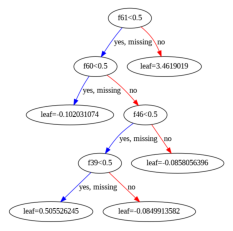

In [ ]:
plt.figure(figsize=(200, 150))
xgb.plot_tree(model)
plt.show()

In [ ]:
print('------------------------------------------------------------')
print('Classification report for XGBoost Classifier ->')
print('------------------------------------------------------------')
print(classification_report(y_test, y_pred))
print('------------------------------------------------------------')
print('Confusion matrix ->')
print('------------------------------------------------------------')
print(confusion_matrix(y_test, y_pred))
print('------------------------------------------------------------')


------------------------------------------------------------
Classification report for XGBoost Classifier ->
------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       0.50      1.00      0.67         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14       

## **Model 3 - SVM Classification**

In [ ]:
svc = SVC(kernel = "poly" )
svc.fit(X_train, y_train)
y_pred_SVC=svc.predict(X_test)

NameError: ignored

In [ ]:
print('------------------------------------------------------------')
print('Classification report for SVM Classifier ->')
print('------------------------------------------------------------')
print(classification_report(y_test, y_pred_SVC))
print('------------------------------------------------------------')
print('Confusion matrix ->')
print('------------------------------------------------------------')
SVM_accuracy = 0.98
print(confusion_matrix(y_test, y_pred_SVC))
print('------------------------------------------------------------')

------------------------------------------------------------
Classification report for SVM Classifier ->
------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14       1.00

In [ ]:
# Y = A[["prognosis"]]
# X = A.drop(["prognosis","Unnamed"],axis=1)
# P = B.drop(["prognosis"],axis=1)
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,random_state=42)

## **Model 4 - Decision tree**

In [ ]:
dtc= DecisionTreeClassifier(random_state=42)
model_dtc = dtc.fit(X_train,y_train)
tr_pred_dtc = model_dtc.predict(X_train)
ts_pred_dtc = model_dtc.predict(X_test)
decision_tree_accuracy = accuracy_score(y_test,ts_pred_dtc)
print("Training Accuracy is :",accuracy_score(y_train,tr_pred_dtc))
print("Testing Accuracy is :",accuracy_score(y_test,ts_pred_dtc))

Training Accuracy is : 1.0
Testing Accuracy is : 0.9761904761904762


<ipython-input-47-a2d86f8ce258>:8: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  feature_names = A.drop('prognosis', 1).columns);


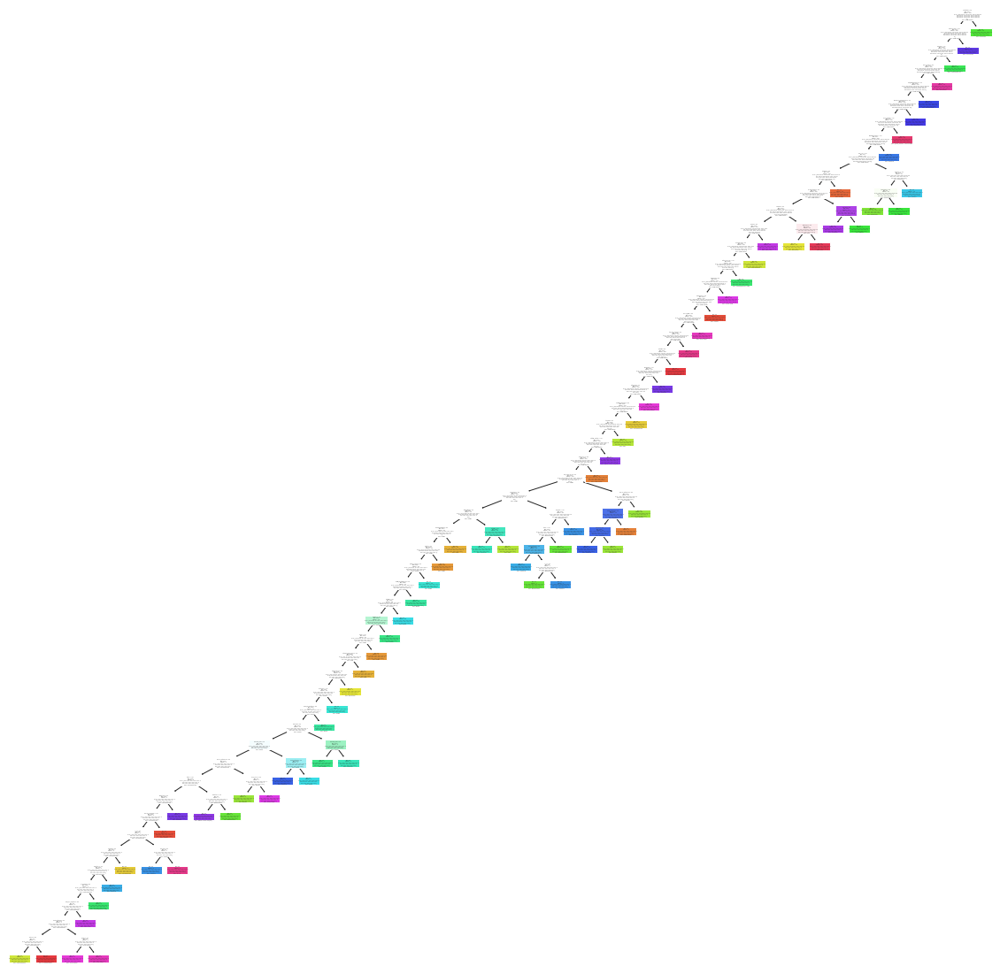

In [ ]:
import graphviz
from sklearn.tree import plot_tree

plt.figure(figsize=(20,20))
plot_tree(dtc,
          filled=True,
          class_names = A.prognosis.unique(),
          feature_names = A.drop('prognosis', 1).columns);

In [ ]:
print('------------------------------------------------------------')
print('Classification report for Decision Tree Classifier ->')
print('------------------------------------------------------------')
print(classification_report(y_test, ts_pred_dtc))
print('------------------------------------------------------------')
print('Confusion matrix ->')
print('------------------------------------------------------------')
print(confusion_matrix(y_test, ts_pred_dtc))
print('------------------------------------------------------------')

------------------------------------------------------------
Classification report for Decision Tree Classifier ->
------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14 

## **Model 5 - Random Forest**

In [ ]:
rfc= RandomForestClassifier(random_state=42)
model_rfc = rfc.fit(X_train,y_train)
tr_pred_rfc = model_rfc.predict(X_train)
ts_pred_rfc = model_rfc.predict(X_test)
random_forest_accuracy = accuracy_score(y_test,ts_pred_rfc)
print("Training Accuracy is :",accuracy_score(y_train,tr_pred_rfc))
print("Testing Accuracy is :",accuracy_score(y_test,ts_pred_rfc))

Training Accuracy is : 1.0
Testing Accuracy is : 0.9761904761904762


In [ ]:
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from subprocess import call
from IPython.display import Image

rfe = model_rfc.estimators_[7]

Y = A[["prognosis"]]
X = A.drop(["prognosis"],axis=1)

export_graphviz(rfe, out_file='random_forest.dot', feature_names = train_df.drop("prognosis", axis = 1).columns, class_names = A.prognosis.unique(), rounded = True, proportion = False, precision = 2, filled = True)

call(['dot', '-Tpng', 'random_forest.dot', '-o', 'random_forest.png', '-Gdpi=600'])
Image(filename = 'random_forest.png')

In [ ]:
print('------------------------------------------------------------')
print('Classification report for Random Forest Classifier ->')
print('------------------------------------------------------------')
print(classification_report(y_test, ts_pred_rfc))
print('------------------------------------------------------------')
print('Confusion matrix ->')
print('------------------------------------------------------------')
print(confusion_matrix(y_test, ts_pred_rfc))
print('------------------------------------------------------------')

------------------------------------------------------------
Classification report for Random Forest Classifier ->
------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14 

## **Model 6 - Clustering**

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

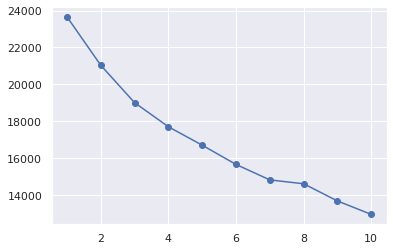

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

data = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_train)
    data.append(kmeans.inertia_)
plt.plot(range(1,11), data, marker="o")
plt.show()

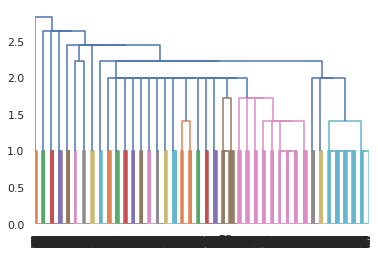


[[0 0 0 ... 0 0 0]]


In [ ]:
linkage_data = linkage(X_train, method="single", metric="euclidean")
dendrogram(linkage_data)
plt.show()
print("")

from scipy.cluster.hierarchy import cut_tree
print(cut_tree(linkage_data, n_clusters = 2).T)

In [ ]:
from sklearn.metrics import silhouette_score

clusters = cut_tree(linkage_data, n_clusters = 2).reshape(-1,)
score = silhouette_score(X_train, clusters, metric = "euclidean")
print("Accuracy Silhouette Score:", 100 - score*100,"%")

Accuracy Silhouette Score: 83.30327292144445 %


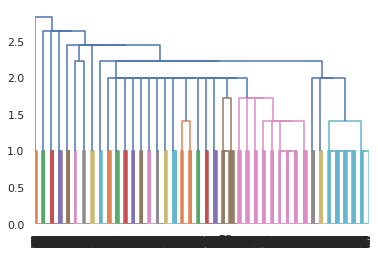

In [ ]:
linkage_data2 = linkage(X_train, method="ward", metric="euclidean")
dendrogram(linkage_data)
plt.show()
print("")

In [ ]:
from scipy.cluster.hierarchy import cut_tree

print(cut_tree(linkage_data2, n_clusters = 2).T)

[[0 0 0 ... 0 0 0]]


In [ ]:
from sklearn.metrics import silhouette_score

clusters = cut_tree(linkage_data2, n_clusters = 2).reshape(-1,)
score = silhouette_score(X_train, clusters, metric = "euclidean")
accuracy_cluster = 100 - score*100
print("Accuracy Silhouette Score:", 100 - score*100,"%")

Accuracy Silhouette Score: 86.00165163424093 %


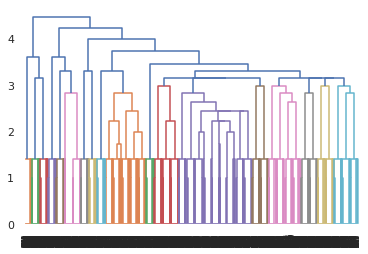


[[0 0 0 ... 0 0 0]]


In [ ]:
linkage_data = linkage(X_train, method="complete", metric="euclidean")
dendrogram(linkage_data)
plt.show()
print("")

from scipy.cluster.hierarchy import cut_tree
print(cut_tree(linkage_data, n_clusters = 2).T)

In [ ]:
from sklearn.metrics import silhouette_score

clusters = cut_tree(linkage_data, n_clusters = 2).reshape(-1,)
score = silhouette_score(X_train, clusters, metric = "euclidean")
print("Accuracy Silhouette Score:", 100 - score*100,"%")

Accuracy Silhouette Score: 76.28650399470754 %


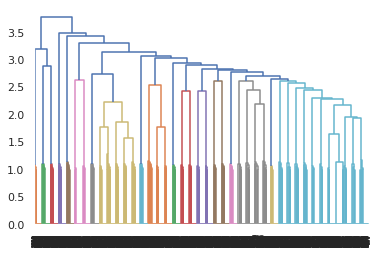


[[0 0 0 ... 0 0 0]]


In [ ]:
linkage_data = linkage(X_train, method="average", metric="euclidean")
dendrogram(linkage_data)
plt.show()
print("")

from scipy.cluster.hierarchy import cut_tree
print(cut_tree(linkage_data, n_clusters = 2).T)

In [ ]:
from sklearn.metrics import silhouette_score

clusters = cut_tree(linkage_data, n_clusters = 2).reshape(-1,)
score = silhouette_score(X_train, clusters, metric = "euclidean")
print("Accuracy Silhouette Score:", 100 - score*100,"%")

Accuracy Silhouette Score: 76.28650399470754 %


### Performance Comparision of the different ML algorithms used

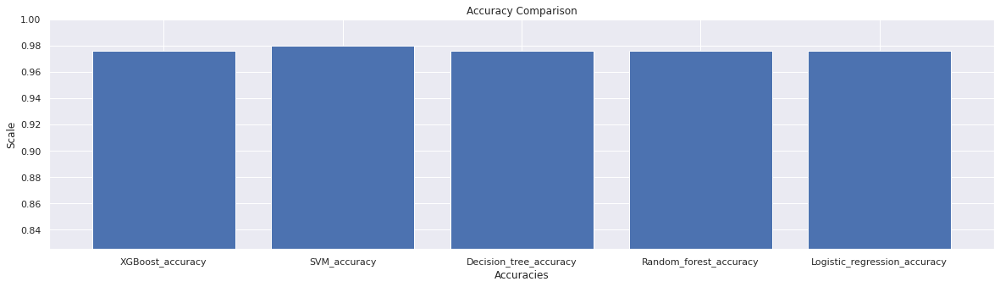

In [ ]:
plt.bar(['XGBoost_accuracy', 'SVM_accuracy', 'Decision_tree_accuracy','Random_forest_accuracy','Logistic_regression_accuracy'], [XGBoost_accuracy, SVM_accuracy, decision_tree_accuracy,random_forest_accuracy,logistic_regression_accuracy])
plt.title('Accuracy Comparison')
plt.xlabel('Accuracies')
plt.ylabel('Scale')
plt.ylim(0.825, 1)
plt.rcParams['figure.figsize'] = [20,5]
plt.show()